# Import Liberaries

In [81]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib
import matplotlib.patches as mpatches
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD
from tqdm import tqdm

import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss, roc_auc_score, accuracy_score
import xgboost as xgb

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Activation, GRU, BatchNormalization
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text

nltk.download('stopwords')
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Data loading

In [3]:
data = pd.read_csv("/kaggle/input/515k-hotel-reviews-data-in-europe/Hotel_Reviews.csv")
data.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


In [4]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Additional_Number_of_Scoring,515738.0,498.081836,500.538467,1.000000,169.000000,341.000000,660.000000,2682.000000
Average_Score,515738.0,8.397487,0.548048,5.200000,8.100000,8.400000,8.800000,9.800000
Review_Total_Negative_Word_Counts,515738.0,18.539450,29.690831,0.000000,2.000000,9.000000,23.000000,408.000000
Total_Number_of_Reviews,515738.0,2743.743944,2317.464868,43.000000,1161.000000,2134.000000,3613.000000,16670.000000
Review_Total_Positive_Word_Counts,515738.0,17.776458,21.804185,0.000000,5.000000,11.000000,22.000000,395.000000
Total_Number_of_Reviews_Reviewer_Has_Given,515738.0,7.166001,11.040228,1.000000,1.000000,3.000000,8.000000,355.000000
Reviewer_Score,515738.0,8.395077,1.637856,2.500000,7.500000,8.800000,9.600000,10.000000
lat,512470.0,49.442439,3.466325,41.328376,48.214662,51.499981,51.516288,52.400181
lng,512470.0,2.823803,4.579425,-0.369758,-0.143372,0.010607,4.834443,16.429233


In [5]:
data.isna().sum()

Hotel_Address                                    0
Additional_Number_of_Scoring                     0
Review_Date                                      0
Average_Score                                    0
Hotel_Name                                       0
Reviewer_Nationality                             0
Negative_Review                                  0
Review_Total_Negative_Word_Counts                0
Total_Number_of_Reviews                          0
Positive_Review                                  0
Review_Total_Positive_Word_Counts                0
Total_Number_of_Reviews_Reviewer_Has_Given       0
Reviewer_Score                                   0
Tags                                             0
days_since_review                                0
lat                                           3268
lng                                           3268
dtype: int64

**We will drop the null rows because we can't replace the lat or lng with mean or median value, that will change the right information hotel adderss**

In [6]:
data.dropna(inplace=True,axis=0)

In [7]:
data.isna().sum()

Hotel_Address                                 0
Additional_Number_of_Scoring                  0
Review_Date                                   0
Average_Score                                 0
Hotel_Name                                    0
Reviewer_Nationality                          0
Negative_Review                               0
Review_Total_Negative_Word_Counts             0
Total_Number_of_Reviews                       0
Positive_Review                               0
Review_Total_Positive_Word_Counts             0
Total_Number_of_Reviews_Reviewer_Has_Given    0
Reviewer_Score                                0
Tags                                          0
days_since_review                             0
lat                                           0
lng                                           0
dtype: int64

In [8]:
data["Hotel_Address"].head(10)

0     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
1     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
2     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
3     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
4     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
5     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
6     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
7     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
8     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
9     s Gravesandestraat 55 Oost 1092 AA Amsterdam ...
Name: Hotel_Address, dtype: object

In [9]:
print("Duplicated rows before: ",data.duplicated().sum())
data.drop_duplicates(inplace=True)
print("Duplicated rows after: ",data.duplicated().sum())

Duplicated rows before:  526
Duplicated rows after:  0


In [10]:
data["Hotel_Address"]=data["Hotel_Address"].str.replace("United Kingdom","UK")

In [11]:
data.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


# EDA

In [12]:
import plotly.express as px
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot


In [13]:
!pip install plotly


# Visualization


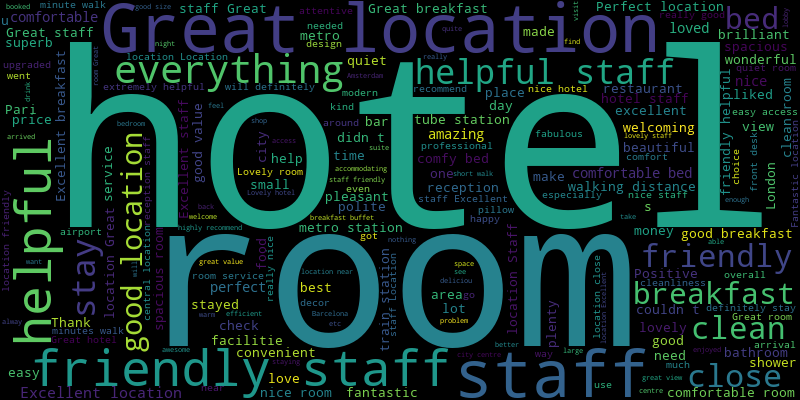

In [14]:
text = " ".join(data[data["Reviewer_Score"] >= 8]["Positive_Review"])
wordcloud = WordCloud(width=800, height=400).generate(text)
fig = px.imshow(wordcloud, title="Word Cloud of Positive Reviews")
fig.show()


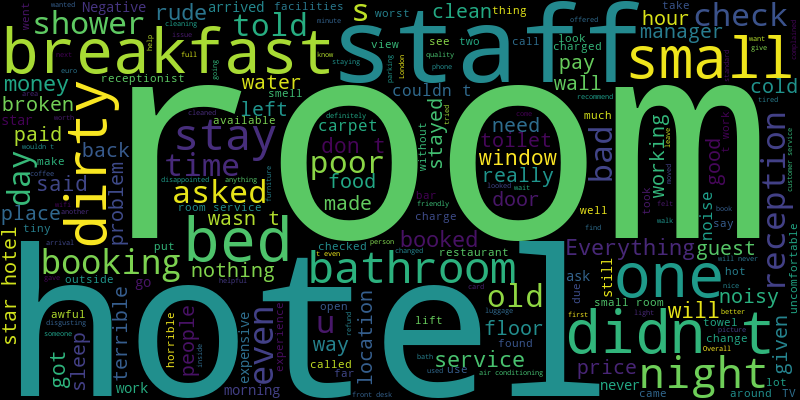

In [15]:
text = " ".join(data[data["Reviewer_Score"] <= 4]["Negative_Review"])
wordcloud = WordCloud(width=800, height=400).generate(text)
fig = px.imshow(wordcloud, title="Word Cloud of Negative Reviews")
fig.show()

In [16]:
data.Reviewer_Nationality.nunique()

227

In [17]:
# Get the top 10 reviewer nationalities with the most reviews
nationality = data["Reviewer_Nationality"].value_counts(dropna=False)[:10]

# Create a bar chart of the nationalities and review counts
fig = px.bar(x=nationality.index, y=nationality.values, color=nationality.index,
             title="Top 10 Nationalities of Reviewers")
fig.update_layout(xaxis_title="Nationality", yaxis_title="Review Count", font=dict(size=14))
fig.show()

In [18]:
data["Hotel_Name"].nunique()

1475

In [19]:
# Get the top 10 hotels with the most reviews
names = data["Hotel_Name"].value_counts(dropna=False)[:10]

fig = px.bar(x=names.index, y=names.values, color=names.index,
             title="Top 10 Hotels with the Most Reviews")
fig.update_layout(xaxis_title="Hotel Name", yaxis_title="Review Count", font=dict(size=14))
fig.show()

In [20]:
fig = px.histogram(data, x="Reviewer_Score", title='Review Score Distribution', nbins=20, text_auto=True)
fig.show()

In [21]:
fig = px.histogram(data, x="Average_Score", title='Review Average Score Distribution')
fig.show()

# Data preparation


In [22]:
data['Negative_Review'][1]

'No Negative'

In [23]:
data.loc[:, 'Positive_Review'] = data.Positive_Review.apply(lambda x: x.replace('No Positive', ''))
data.loc[:, 'Negative_Review'] = data.Negative_Review.apply(lambda x: x.replace('No Negative', ''))

In [24]:
data['Negative_Review'][1]

''

In [25]:
data["Total_Review"] = data["Negative_Review"] + data["Positive_Review"]

In [26]:
data["review_type"] = data["Reviewer_Score"].apply(
    lambda x: "Bad_review" if x < 7 else "Good_review")

In [27]:
df_reviews = data[["Total_Review", "review_type"]]

In [28]:
df_reviews

,Total_Review,review_type
0,I am so angry that i made this post available...,Bad_review
1,No real complaints the hotel was great great ...,Good_review
2,Rooms are nice but for elderly a bit difficul...,Good_review
3,My room was dirty and I was afraid to walk ba...,Bad_review
4,You When I booked with your company on line y...,Bad_review
...,...,...
515733,no trolly or staff to help you take the lugga...,Good_review
515734,The hotel looks like 3 but surely not 4 Brea...,Bad_review
515735,The ac was useless It was a hot week in vienn...,Bad_review
515736,The rooms are enormous and really comfortable...,Good_review


In [29]:
fig = px.histogram(df_reviews, x="review_type", title='Review Type Distribution', text_auto=True)
fig.show()

In [30]:
df_reviews[df_reviews.review_type == 'Good_review'].Total_Review.value_counts()

 Location                                                                      940
 Nothing Everything                                                            936
 Everything                                                                    597
 Great location                                                                252
 Everything                                                                    203
                                                                              ... 
 Outdated hotel rooms a bit shabby arogant receptionists Excellent location      1
 Staff unobtrusive but efficient Queries answered in a helpful manner            1
 Room Service food was awful but breakfast was good                              1
 all good location                                                               1
 I was in 3rd floor It didn t work Free Wife  staff was very kind                1
Name: Total_Review, Length: 411312, dtype: int64

In [31]:
df_reviews[df_reviews.review_type == 'Bad_review'].Total_Review.value_counts()

 Everything Nothing                                                                                    123
 Location                                                                                              105
 Nothing                                                                                                36
 location                                                                                               26
 Staff                                                                                                  22
                                                                                                      ... 
 The hotel is not four star                                                                              1
 The staff checking us in was rude and very un polite The breakfast was cold and tasted disgusting       1
 Noisy fan so couldn t sleep kettle didn t work cold shower                                              1
 Hotel isn t good marked from the str

**Resample Dataset**

Under sample the positive review to achieve a balanced distribution between reviews**

In [32]:
good_reviews = df_reviews[df_reviews.review_type == "Good_review"]
bad_reviews = df_reviews[df_reviews.review_type == "Bad_review"]

In [33]:
good_df = good_reviews.sample(n=len(bad_reviews), random_state=42)

df_review_resampled = good_df.append(bad_reviews).reset_index(drop=True)
df_review_resampled.shape

/tmp/ipykernel_32/1327184193.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



(172350, 2)

In [34]:
df_review_resampled.head()

,Total_Review,review_type
0,Being really picky here as all was great but ...,Good_review
1,We were given unbeknown to us a handicap acce...,Good_review
2,Location a little restrictive Hotel facilities,Good_review
3,Staff service at the bar was appalling Bed w...,Good_review
4,No information in rooms about London and some...,Good_review


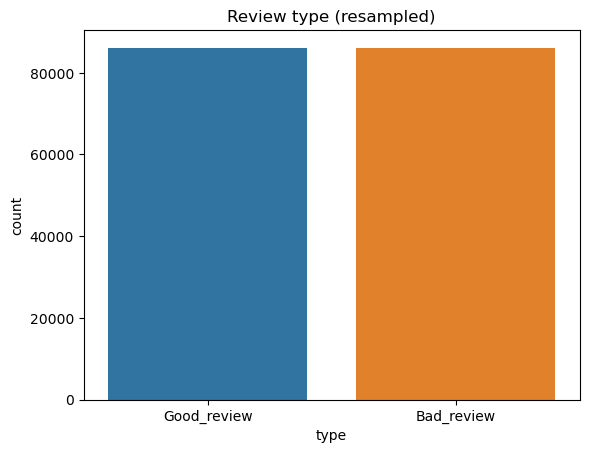

In [35]:
sns.countplot(
  x='review_type',
  data=df_review_resampled,
  order=df_review_resampled.review_type.value_counts().index
)

plt.xlabel("type")
plt.title("Review type (resampled)");

In [36]:
from sklearn.preprocessing import LabelEncoder
encoder =LabelEncoder()
encoded_review = encoder.fit_transform(df_review_resampled.review_type.values)

In [37]:
encoded_review[1:5]

array([1, 1, 1, 1])

In [38]:
from sklearn.model_selection import train_test_split, GridSearchCV

train_reviews, test_reviews, y_train, y_test = train_test_split(
    df_review_resampled.Total_Review, 
    encoded_review, 
    test_size=0.25, 
    random_state=42
  )

In [39]:
train_reviews.shape, test_reviews.shape, y_train.shape, y_test.shape

((129262,), (43088,), (129262,), (43088,))

# Feature Engineering 


In [40]:
%%time
tfv = TfidfVectorizer(min_df=3,  max_features=None, 
            strip_accents='unicode', analyzer='word',token_pattern=r'\w{1,}',
            ngram_range=(1, 3), use_idf=1,smooth_idf=1,sublinear_tf=1,
            stop_words = 'english')

tfv.fit(list(train_reviews) + list(test_reviews))

X_train_tfv =  tfv.transform(train_reviews) 
X_test_tfv = tfv.transform(test_reviews)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/_param_validation.py:558: FutureWarning:

Passing an int for a boolean parameter is deprecated in version 1.2 and won't be supported anymore in version 1.4.



CPU times: user 31.5 s, sys: 855 ms, total: 32.4 s
Wall time: 32.4 s


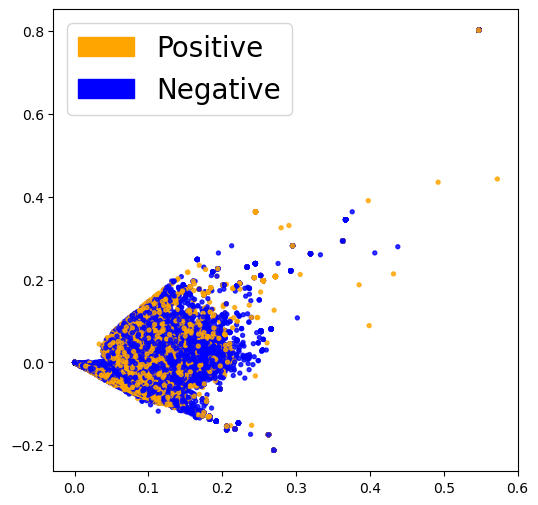

In [41]:
def plot_LSA(data, labels):
    lsa = TruncatedSVD(n_components=2)
    lsa.fit(data)
    lsa_scores = lsa.transform(data)

    colors = ['orange','blue']
    plt.scatter(lsa_scores[:,0], lsa_scores[:,1], s=8, alpha=.8, c=labels, cmap=matplotlib.colors.ListedColormap(colors))
    orange_patch = mpatches.Patch(color='orange', label='Positive')
    blue_patch = mpatches.Patch(color='blue', label='Negative')
    plt.legend(handles=[orange_patch, blue_patch], prop={'size': 20})

fig = plt.figure(figsize=(6,6))          
plot_LSA(X_train_tfv, y_train)
plt.show()

In [42]:
%%time
ctv = CountVectorizer(analyzer='word',token_pattern=r'\w{1,}',
            ngram_range=(1, 3), stop_words = 'english')

# Fitting Count Vectorizer to both training and test sets (semi-supervised learning)
ctv.fit(list(train_reviews) + list(test_reviews))

X_train_ctv=  ctv.transform(train_reviews) 
X_test_ctv = ctv.transform(test_reviews)

CPU times: user 41.2 s, sys: 928 ms, total: 42.2 s
Wall time: 42.2 s


**LSA- plot**

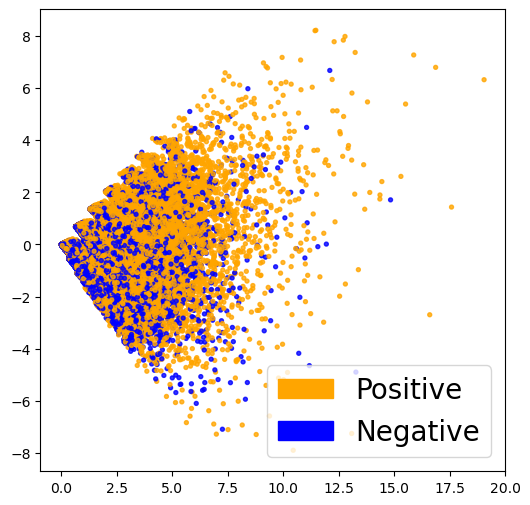

In [43]:
fig = plt.figure(figsize=(6,6))          
plot_LSA(X_train_ctv, y_train)
plt.show()

# Models 

# Logistic Regression

In [44]:
def model_predict(clf, X_train, y_train, X_test, y_test):
    clf.fit(X_train, y_train)
    
    # Get predictions for training and testing data
    train_pred = clf.predict_proba(X_train)
    test_pred = clf.predict_proba(X_test)
    
    # Calculate metrics for training data
    train_loss = log_loss(y_train, train_pred)
    train_auc = roc_auc_score(y_train, train_pred[:, 1])
    train_acc = accuracy_score(y_train, clf.predict(X_train))
    
    # Calculate metrics for testing data
    test_loss = log_loss(y_test, test_pred)
    test_auc = roc_auc_score(y_test, test_pred[:, 1])
    test_acc = accuracy_score(y_test, clf.predict(X_test))
    
    # Print metrics for training and testing data
    print(f"Training loss: {train_loss:.3f}")
    print(f"Training AUC: {train_auc:.3f}")
    print(f"Training accuracy: {train_acc:.3f}")
    
    print(f"Testing loss: {test_loss:.3f}")
    print(f"Testing AUC: {test_auc:.3f}")
    print(f"Testing accuracy: {test_acc:.3f}")

In [45]:
%%time
# issue: https://stackoverflow.com/a/66560912/11105356
clf = LogisticRegression(C=1.0, solver='lbfgs', max_iter=1000)

# count vector feature
model_predict(clf, X_train_ctv,y_train, X_test_ctv, y_test)

Training loss: 0.101
Training AUC: 0.998
Training accuracy: 0.981
Testing loss: 0.445
Testing AUC: 0.899
Testing accuracy: 0.816
CPU times: user 8min 4s, sys: 5min 2s, total: 13min 7s
Wall time: 4min 25s


In [46]:
%%time

# Tf-IDF feature 
model_predict(clf, X_train_tfv,y_train, X_test_tfv, y_test)

Training loss: 0.330
Training AUC: 0.946
Training accuracy: 0.873
Testing loss: 0.398
Testing AUC: 0.903
Testing accuracy: 0.822
CPU times: user 1min, sys: 1min 3s, total: 2min 4s
Wall time: 32.2 s


# XGBoost 

In [47]:
%%time
clf = xgb.XGBClassifier(max_depth=7, n_estimators=200, colsample_bytree=0.8, 
                        use_label_encoder=False,
                        subsample=0.8, nthread=10, learning_rate=0.01)
# Tf-IDF feature 

model_predict(clf, X_train_tfv, y_train, X_test_tfv, y_test)

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:1395: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.



Training loss: 0.550
Training AUC: 0.832
Training accuracy: 0.746
Testing loss: 0.559
Testing AUC: 0.820
Testing accuracy: 0.736
CPU times: user 8min 40s, sys: 2.17 s, total: 8min 42s
Wall time: 2min 20s


In [48]:
%%time
model_predict(clf, X_train_ctv, y_train, X_test_ctv, y_test)

Training loss: 0.553
Training AUC: 0.830
Training accuracy: 0.745
Testing loss: 0.559
Testing AUC: 0.821
Testing accuracy: 0.736
CPU times: user 17min 49s, sys: 6.61 s, total: 17min 55s
Wall time: 5min 34s


# CNN 

In [53]:
X_train = []
for r in tqdm(train_reviews):
    emb = use(r)
    review_emb = tf.reshape(emb, [-1]).numpy()
    X_train.append(review_emb)

X_train = np.array(X_train)

100%|██████████| 129262/129262 [32:20<00:00, 66.60it/s]


In [58]:
X_test = []
for r in tqdm(test_reviews):
    emb = use(r)
    review_emb = tf.reshape(emb, [-1]).numpy()
    X_test.append(review_emb)

X_test = np.array(X_test)

100%|██████████| 43088/43088 [10:33<00:00, 68.00it/s]


In [59]:
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(129262, 512) (43088, 512)
(129262,) (43088,)


In [60]:
x_traincnn =np.expand_dims(X_train, axis=2)
x_testcnn= np.expand_dims(X_test, axis=2)

In [61]:
def build_model_1():
    
    model = Sequential()
    model.add(Conv1D(256, kernel_size=3, activation='relu', input_shape=(x_traincnn.shape[1], 1)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(0.3))
    model.add(Conv1D(128, kernel_size=3, activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(0.3))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy',
            metrics=['accuracy'],
            optimizer=Adam(learning_rate=0.001))
    return model

In [62]:
model_1 = build_model_1()
history = model_1.fit(
    x_traincnn, y_train, 
    epochs=15, 
    batch_size=16, 
    validation_split=0.2,
    verbose=1, 
    shuffle=True
)

Epoch 1/15
6464/6464 [==============================] - 29s 4ms/step - loss: 0.4791 - accuracy: 0.7683 - val_loss: 0.4496 - val_accuracy: 0.7839
Epoch 2/15
6464/6464 [==============================] - 28s 4ms/step - loss: 0.4549 - accuracy: 0.7836 - val_loss: 0.4391 - val_accuracy: 0.7921
Epoch 3/15
6464/6464 [==============================] - 28s 4ms/step - loss: 0.4493 - accuracy: 0.7865 - val_loss: 0.4660 - val_accuracy: 0.7704
Epoch 4/15
6464/6464 [==============================] - 28s 4ms/step - loss: 0.4454 - accuracy: 0.7892 - val_loss: 0.4310 - val_accuracy: 0.7963
Epoch 5/15
6464/6464 [==============================] - 28s 4ms/step - loss: 0.4428 - accuracy: 0.7892 - val_loss: 0.4304 - val_accuracy: 0.7985
Epoch 6/15
6464/6464 [==============================] - 28s 4ms/step - loss: 0.4414 - accuracy: 0.7902 - val_loss: 0.4254 - val_accuracy: 0.7981
Epoch 7/15
6464/6464 [==============================] - 28s 4ms/step - loss: 0.4384 - accuracy: 0.7929 - val_loss: 0.4320 - val_ac

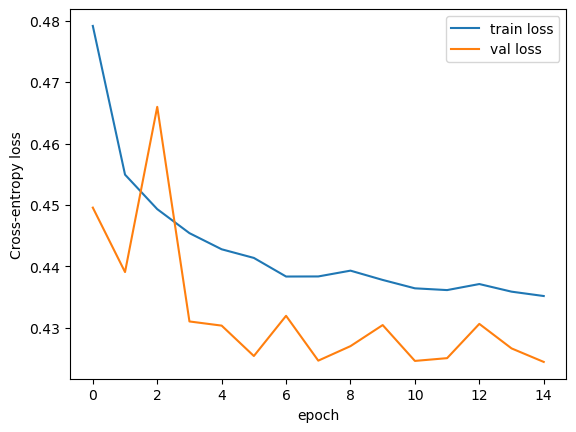

In [63]:
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.xlabel("epoch")
plt.ylabel("Cross-entropy loss")
plt.legend();

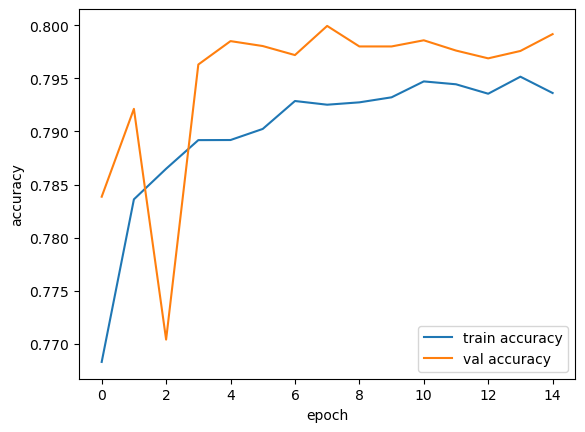

In [64]:
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.legend();

In [65]:
model_1.evaluate(x_testcnn, y_test)


1347/1347 [==============================] - 4s 3ms/step - loss: 0.4286 - accuracy: 0.8013


[0.4285663366317749, 0.8013368248939514]

# LSTM Model

In [66]:
#  Reshape the data to fit model
y_train.shape
#reshape for lstm
X_train_reshaped = X_train.reshape(X_train.shape[0] , X_train.shape[1] , 1)
X_test_reshaped = X_test.reshape(X_test.shape[0] , X_test.shape[1] , 1)


In [67]:
X_test_reshaped.shape

(43088, 512, 1)

In [68]:
X_train_reshaped.shape

(129262, 512, 1)

In [69]:
X_train_reshaped = np.reshape(X_train, (129262, 1, 512))
X_test_reshaped = np.reshape(X_test, (43088, 1, 512))

In [70]:
X_test_reshaped.shape

(43088, 1, 512)

In [71]:
X_train_reshaped.shape

(129262, 1, 512)

In [72]:
# input_shape
1,X_train_reshaped.shape[2]

(1, 512)

In [73]:
def build_model_lstm():
    model = Sequential()
    model.add(LSTM(256, activation='sigmoid', return_sequences=True,
                 input_shape=(1, X_train_reshaped.shape[2])
                 ))
    model.add(Dropout(0.5))
    model.add(LSTM(128, activation='sigmoid', return_sequences=False))
    model.add(Dropout(0.3))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy',
            metrics=['accuracy'],
            optimizer=Adam(learning_rate=0.0005))
    return model

In [74]:
model_lstm_1 = build_model_lstm()


In [75]:
%%time

history_lstm_1 = model_lstm_1.fit(
    X_train_reshaped, y_train, 
    epochs=15, 
    batch_size=16, 
    validation_split=0.1, 
    verbose=1, 
    shuffle=True # text data, safe to shuffle
)

Epoch 1/15
7271/7271 [==============================] - 72s 9ms/step - loss: 0.4919 - accuracy: 0.7561 - val_loss: 0.4323 - val_accuracy: 0.7971
Epoch 2/15
7271/7271 [==============================] - 66s 9ms/step - loss: 0.4459 - accuracy: 0.7891 - val_loss: 0.4223 - val_accuracy: 0.8005
Epoch 3/15
7271/7271 [==============================] - 65s 9ms/step - loss: 0.4342 - accuracy: 0.7923 - val_loss: 0.4175 - val_accuracy: 0.8016
Epoch 4/15
7271/7271 [==============================] - 65s 9ms/step - loss: 0.4296 - accuracy: 0.7954 - val_loss: 0.4147 - val_accuracy: 0.8010
Epoch 5/15
7271/7271 [==============================] - 65s 9ms/step - loss: 0.4259 - accuracy: 0.7975 - val_loss: 0.4126 - val_accuracy: 0.8013
Epoch 6/15
7271/7271 [==============================] - 66s 9ms/step - loss: 0.4239 - accuracy: 0.7979 - val_loss: 0.4114 - val_accuracy: 0.8042
Epoch 7/15
7271/7271 [==============================] - 66s 9ms/step - loss: 0.4210 - accuracy: 0.7983 - val_loss: 0.4100 - val_ac

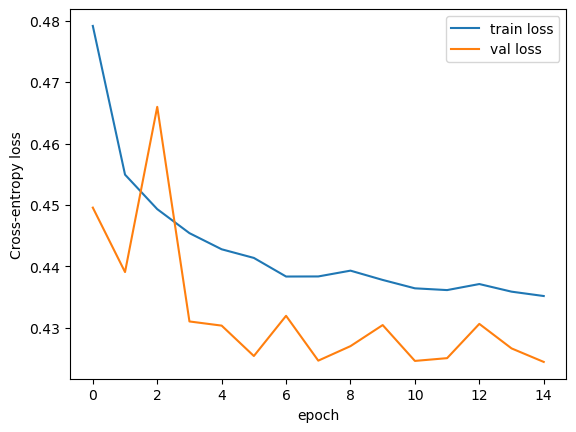

In [76]:
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.xlabel("epoch")
plt.ylabel("Cross-entropy loss")
plt.legend();

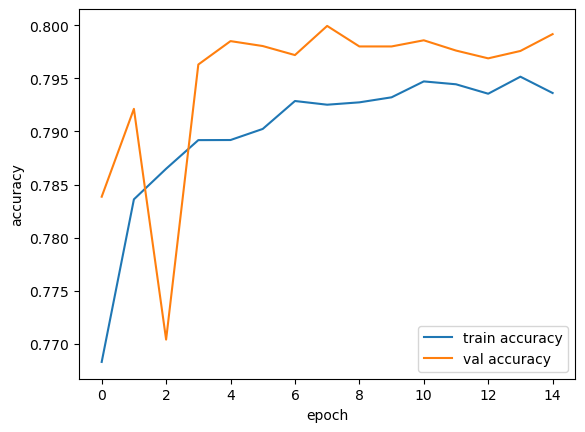

In [77]:
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.legend();

In [79]:
model_lstm_1.evaluate(X_test_reshaped, y_test)


1347/1347 [==============================] - 4s 3ms/step - loss: 0.4097 - accuracy: 0.8052


[0.4097093641757965, 0.8051893711090088]